### Tweeter NLP Data
#### 1. Imports and EDA

In [1]:
# !pip install scikit-learn-intelex
# !pip freeze | grep -E 'ydata-profiling|visions'

In [2]:
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
from ydata_profiling.config import Settings

import nltk
from nltk.corpus import stopwords
import re
import os
import joblib
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Sklearn imports
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.decomposition import TruncatedSVD
from sklearn.compose import ColumnTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline

# Classification models
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# For classification metrics
from sklearn.metrics import classification_report

# For dealing with imbalanced data
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline

# Naive Bayes
from sklearn.naive_bayes import MultinomialNB

# Support Vector Optimizers
from sklearnex import patch_sklearn
patch_sklearn()
from sklearn.svm import SVC

from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import TruncatedSVD

config = Settings()
# Disable chi-square test for numeric variables
config.vars.num.chi_squared_threshold = 0.0

%load_ext autoreload
%autoreload 2
%matplotlib inline

df_raw = pd.read_csv('./data/nlp_tweet/tweet_data.csv')
df = df_raw.copy()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/uxlfoundation/scikit-learn-intelex)


In [3]:
df.sample(15).T

,511394,734109,488108,679285,184586,630730,650699,152370,759684,17249,257412,624812,124831,658919,653766
tweetID,1129134789871767552,1150140267913261056,1126649301482885120,1145072353203904512,1094881253013286912,1141314687574925312,1143082242106781697,1090986817845899267,1152168792862208002,1073387617083908096,1103154548418494464,1140833469112754176,1087794046574256129,1143679074545610753,1143290210643578881
crDate,2019-05-16 21:21:26,2019-07-13 20:29:43,2019-05-10 00:45:00,2019-06-29 20:51:38,2019-02-11 08:50:07,2019-06-19 12:00:00,2019-06-24 09:03:38,2019-01-31 14:55:01,2019-07-19 10:50:21,2018-12-14 01:22:05,2019-03-06 04:45:14,2019-06-18 04:07:49,2019-01-22 19:28:05,2019-06-26 00:35:14,2019-06-24 22:50:02
edInput,1,1,-1,-1,-1,1,1,-1,1,-1,-1,1,2,-1,4
editor,5002,5007,-1,-1,-1,5008,5008,-1,5007,-1,-1,5006,5001,-1,5004
engages,4,16,129,132,1199,50,3461,55,25,7,33,380,17,6,238
isApproved,True,True,False,False,False,True,True,False,True,False,False,True,False,False,False
isEdNeed,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
isRT,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False
likes,3,16,97,110,843,40,2230,35,19,4,25,256,10,5,168
photoUrl,https://pbs.twimg.com/media/D6t97P7X4AENDy2.jpg,https://pbs.twimg.com/media/D_YeW45WwAI0hJw.png,NaN,NaN,NaN,NaN,NaN,https://pbs.twimg.com/media/DyP2uq0WwAEkdS8.jpg,https://pbs.twimg.com/media/D_1TaVKXoAEy4Nt.jpg,https://pbs.twimg.com/media/DuVwWU4X4AAlsV9.jpg,NaN,NaN,NaN,https://pbs.twimg.com/media/D98qDrwXkAU07_L.jpg,NaN


In [4]:
# Runs Auto-EDA of data, see tweet_EDA_report.html in project folder magnimind_projects
# profile = ProfileReport(df, title='Tweet Profile Report', explorative=True, config=config)
# profile.to_file('tweet_EDA_report.html')

### 2. Feature Selections and Word Cloud

In [5]:
df_reduced = df[['editor', 'topicName', 'text', 'edInput']].copy()
df_reduced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 785916 entries, 0 to 785915
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   editor     785916 non-null  int64 
 1   topicName  785916 non-null  object
 2   text       785916 non-null  object
 3   edInput    785916 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 24.0+ MB


In [6]:
# nltk.download('stopwords')

In [7]:
stop_words = set(stopwords.words('english'))

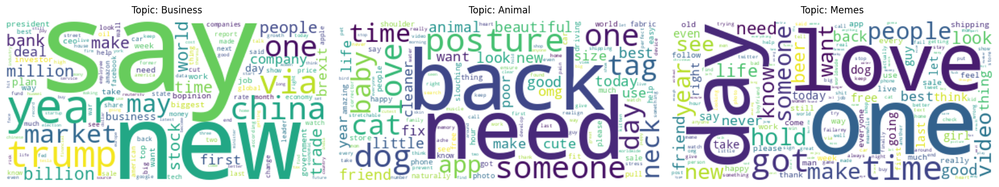

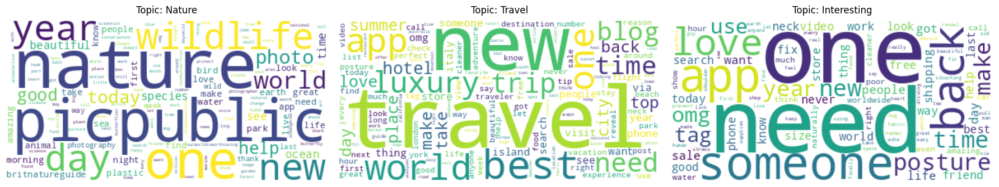

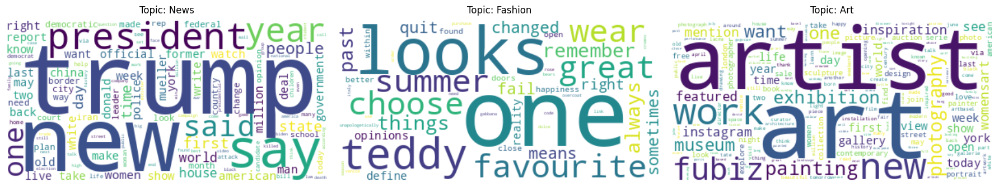

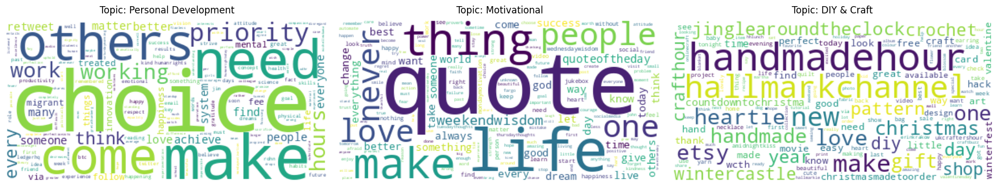

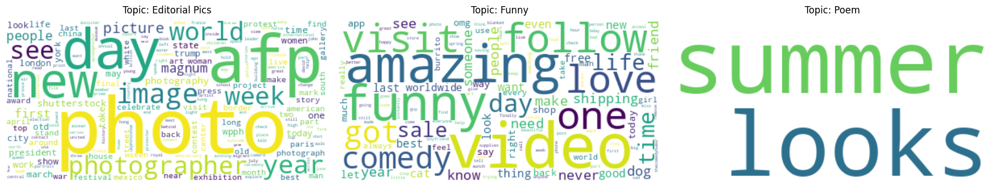

...

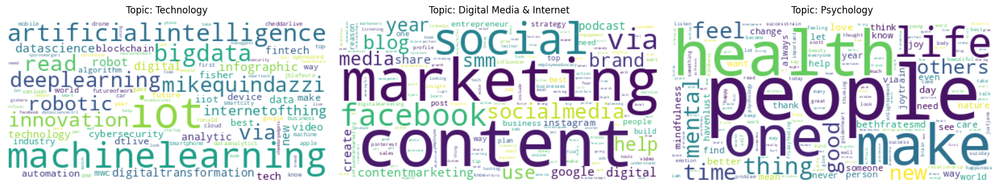

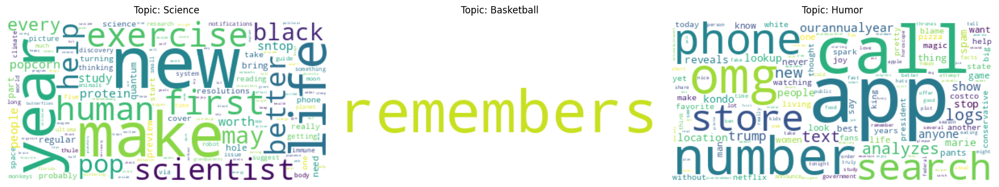

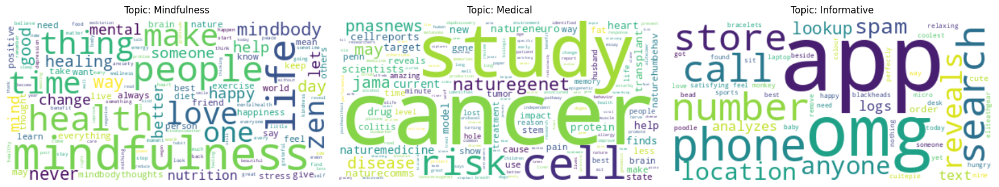

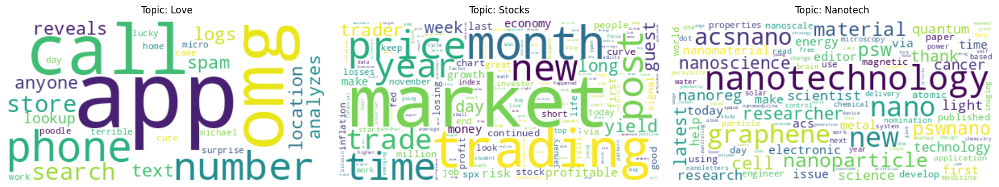

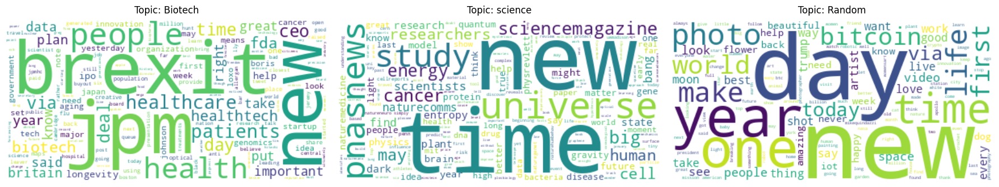

In [8]:
# Define a text-cleaning function
# Generate word clouds for each topicName
# We group rows by topicName, concatenate the cleaned text, and make a WordCloud.

stop_words = set(stopwords.words('english'))

def cleanup_text(text):
    # Remove URLs
    text = re.sub(r'https?://\S+', '', text)
    # Keep only letters + whitespace; make lowercase
    text = re.sub(r'[^a-zA-Z\s]', ' ', text).lower()
    # Tokenize on whitespace
    tokens = text.split()
    # Remove stopwords
    tokens = [t for t in tokens if t not in stop_words]
    # Keep tokens > 2 characters, purely alphabetical
    tokens = [t for t in tokens if t.isalpha() and len(t) > 2]
    return ' '.join(tokens)

df_reduced['cleaned_text'] = df_reduced['text'].apply(cleanup_text)

topics = df_reduced['topicName'].unique()

chunk_size = 3
for i in range(0, len(topics), chunk_size):
    # For this figure, grab up to 3 topics
    chunk = topics[i:i+chunk_size]
    
    # Create one figure to hold up to 3 columns
    # Adjust figsize as you like
    fig = plt.figure(figsize=(18, 6))

    for j, topic in enumerate(chunk):
        # Gather text for this topic
        group = df_reduced[df_reduced['topicName'] == topic]
        all_text = " ".join(group['cleaned_text'])
        
        # Generate the word cloud
        wordcloud = WordCloud(background_color='white', 
                              collocations=False
                             ).generate(all_text)
        
        # Manually place an Axes in the figure:
        # e.g., 3 columns => each ~0.33 wide
        left = 0.01 + 0.33*j   # shift each axis horizontally
        ax = fig.add_axes([left, 0.05, 0.32, 0.85]) 
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.set_title(f"Topic: {topic}", pad=10)
        ax.axis("off")
    
    # Show the figure for this set of 3 topics
    plt.show()
    plt.close(fig)

### 3. Predict edInput

In [15]:
df_model = df_reduced[['editor', 'topicName', 'cleaned_text', 'edInput']].copy()
print(f'{df_model.info()}\n')
##############################################################################
# 1. DATA PREP (Assume df_model has "editor", "topicName", "cleaned_text", "edInput")
##############################################################################

# For example: map y from {1,2,3} => {0,1,2} if not already done
df_model['edInput'] = df_model['edInput'].replace({-1:3, 3:3, 4:3})  # (-1,3,4 => 3; 1 => 1; 2 => 2)
df_model['edInput'] = df_model['edInput'].replace({1:0, 2:1, 3:2}).copy()
print(f'{df_model['edInput'].value_counts()}')

X = df_model[['editor', 'topicName', 'cleaned_text']]
y = df_model['edInput']

# Split into train/test
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.1,       
    random_state=42,
    stratify=y
)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 785916 entries, 0 to 785915
Data columns (total 4 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   editor        785916 non-null  int64 
 1   topicName     785916 non-null  object
 2   cleaned_text  785916 non-null  object
 3   edInput       785916 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 24.0+ MB
None

edInput
2    463598
0    215577
1    106741
Name: count, dtype: int64


In [10]:
##############################################################################
# 2. PREPROCESSOR (TF-IDF -> TruncatedSVD -> MinMaxScaler, plus OHE for cat)
##############################################################################

text_pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(max_features=350)),
    ('svd', TruncatedSVD(n_components=11)),
    ('minmax', MinMaxScaler(feature_range=(0,1)))
])

cat_pipeline = Pipeline([
    ('ohe', OneHotEncoder(handle_unknown='ignore', sparse_output=True))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('text', text_pipeline, 'cleaned_text'),
        ('cat',  cat_pipeline,  ['editor', 'topicName'])
    ],
    remainder='drop'
)


In [11]:
##############################################################################
# 3. DEFINE MODELS AND PARAM GRIDS
##############################################################################

# We'll do a dictionary: { model_name: (model, param_grid) }
# Adjust the ranges to what makes sense for your data!

models_and_grids = {
    'LogisticRegression': (
        LogisticRegression(
            max_iter=1000,
            class_weight={0:1, 1:2, 2:1}  # multi-class weighting
        ),
        {
            'classifier__C': [0.1, 1, 10]
        }
    ),
    'RandomForest': (
        RandomForestClassifier(
            class_weight={0:1, 1:2, 2:1},
            n_jobs=-1
        ),
        {
            'classifier__n_estimators': [100, 200],
            'classifier__max_depth': [10, 20, None]
        }
    ),
    'XGBoost': (
        XGBClassifier(
            use_label_encoder=False,
            eval_metric='mlogloss',
            n_jobs=-1
            # class_weight not used for multi-class
        ),
        {
            'classifier__learning_rate': [0.01, 0.1],
            'classifier__max_depth': [6, 10]
        }
    ),
    'SGDClassifier': (
        SGDClassifier(
            loss='hinge',  # linear SVM-like
            penalty='l2',
            random_state=42,
            n_jobs=-1
        ),
        {
            'classifier__alpha': [1e-4, 1e-3, 1e-2],
            'classifier__max_iter': [1000, 2000]
        }
    ),
    # Include or remove Naive Bayes as you wish
    'NaiveBayes': (
        MultinomialNB(), 
        {
            # NB doesn't support class_weight, can still use SMOTE for minority classes
            'classifier__alpha': [1.0, 0.1, 0.01]
        }
    )
}

##############################################################################
# 4. CREATE ./models DIRECTORY IF NOT EXISTS
##############################################################################
os.makedirs("./models", exist_ok=True)


In [12]:
##############################################################################
# 5. GRID SEARCH OVER EACH MODEL, SAVE BEST ESTIMATOR
##############################################################################
# from sklearn.model_selection import StratifiedKFold

# # Use an imblearn pipeline so we can do SMOTE + classifier
# # We'll only vary 'classifier__...' params in param_grid

# # We do a simple 3-fold CV. Tweak as desired.
# cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# for model_name, (model, param_grid) in models_and_grids.items():
#     print(f"\n=== Grid Searching: {model_name} ===")
    
#     pipeline = ImbPipeline([
#         ('preprocessor', preprocessor),
#         ('smote', SMOTE()),   # Oversample minority classes
#         ('classifier', model)
#     ])
    
#     # For multi-class tasks, you might want 'f1_macro' or 'accuracy'
#     # Adjust scoring as you prefer
#     grid_search = GridSearchCV(
#         pipeline,
#         param_grid=param_grid,
#         scoring='f1_macro',
#         cv=cv,
#         n_jobs=-1,         # parallel search
#         verbose=1
#     )
    
#     grid_search.fit(X_train, y_train)
    
#     print("Best Params:", grid_search.best_params_)
#     print("Best CV Score:", f"{grid_search.best_score_:.3f}")
    
#     # Save the best estimator (including pipeline steps)
#     best_model_path = f"./models/{model_name}_best.joblib"
#     joblib.dump(grid_search.best_estimator_, best_model_path)
#     print(f"Saved best {model_name} to {best_model_path}")

In [16]:
##############################################################################
# 6. LOAD THE BEST ESTIMATORS AND PRINT CLASSIFICATION REPORTS
##############################################################################
for model_name in models_and_grids.keys():
    best_model_path = f"./models/{model_name}_best.joblib"
    print(f"\n=== Loading best {model_name} ===")
    best_pipeline = joblib.load(best_model_path)
    
    # Predict on the test set
    y_pred = best_pipeline.predict(X_test)
    
    # Show classification metrics
    print(f"Classification Report for {model_name}:")
    print(classification_report(y_test, y_pred))


=== Loading best LogisticRegression ===
Classification Report for LogisticRegression:
              precision    recall  f1-score   support

           0       0.81      0.45      0.58     21558
           1       0.40      0.90      0.55     10674
           2       1.00      0.92      0.96     46360

    accuracy                           0.78     78592
   macro avg       0.74      0.75      0.69     78592
weighted avg       0.87      0.78      0.80     78592


=== Loading best RandomForest ===
Classification Report for RandomForest:
              precision    recall  f1-score   support

           0       0.77      0.73      0.75     21558
           1       0.54      0.73      0.62     10674
           2       0.99      0.93      0.96     46360

    accuracy                           0.85     78592
   macro avg       0.76      0.80      0.78     78592
weighted avg       0.87      0.85      0.85     78592


=== Loading best XGBoost ===
Classification Report for XGBoost:
           